# IBM Capstone Project

In this project, I will find out the best neighborhood in Toronto for entrepreneurs to open a new Italian Restaurant by:

- Using multiple datasets from different sources (i.e. Web, Geocode, CSV files, Foursquare API)
- Python Webscraping using Beautifulsoup
- Data Preprocessing
- Data Analysis



In [1]:
# import necessary libraries 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import requests
import json
from bs4 import BeautifulSoup
import matplotlib.cm as cm
import matplotlib.colors as colors
from yellowbrick.cluster import KElbowVisualizer
from IPython.display import HTML, display

%matplotlib inline
print('Packages installed  :)')

Packages installed  :)


In [2]:
# Get the neighborhood data using beautiful soup 
#url='https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'
url="https://en.wikipedia.org/w/index.php?title=List_of_postal_codes_of_Canada:_M&direction=prev&oldid=926287641"

result = requests.get(url)
data_html = BeautifulSoup(result.content)

In [3]:
# Now we will read the data into a Pandas Dataframe
soup = BeautifulSoup(str(data_html))
neigh = soup.find('table')
table_str = str(neigh.extract())

In [4]:
df = pd.read_html(table_str)[0]
df.head()

,Postcode,Borough,Neighbourhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,Harbourfront


We see that there are Not assigned Boroughs so we will remove those

In [5]:
df_dropna = df[df.Borough != 'Not assigned'].reset_index(drop=True)

Then we will rename Postalcode to PostalCode so that variable indexing will be easier

In [6]:
df_dropna.rename(columns={'Postcode' : 'PostalCode'}, inplace=True)
df = df_dropna
df.head()

,PostalCode,Borough,Neighbourhood
0,M3A,North York,Parkwoods
1,M4A,North York,Victoria Village
2,M5A,Downtown Toronto,Harbourfront
3,M5A,Downtown Toronto,Regent Park
4,M6A,North York,Lawrence Heights


### Now we will group the data based on Borough

In [7]:
df_grouped = df.groupby(['Borough', 'PostalCode'], as_index=False).agg(lambda x:','.join(x))
df_grouped.head()

,Borough,PostalCode,Neighbourhood
0,Central Toronto,M4N,Lawrence Park
1,Central Toronto,M4P,Davisville North
2,Central Toronto,M4R,North Toronto West
3,Central Toronto,M4S,Davisville
4,Central Toronto,M4T,"Moore Park,Summerhill East"


In [8]:
# Check if we still have any Neighborhoods that are Not Assigned
df_grouped.loc[df_grouped['Borough'].isin(["Not assigned"])]

,Borough,PostalCode,Neighbourhood


### So now all the requirements are met and the data is cleansed, now we just have to add the Latitude and Longitudes of each location


In [9]:
df = df_grouped
df.shape

(103, 3)

### Rearranged the Columns so the **PostalCode** appears first for easier readibility

In [10]:
df = df[['PostalCode', 'Borough', 'Neighbourhood']]
df.head()

,PostalCode,Borough,Neighbourhood
0,M4N,Central Toronto,Lawrence Park
1,M4P,Central Toronto,Davisville North
2,M4R,Central Toronto,North Toronto West
3,M4S,Central Toronto,Davisville
4,M4T,Central Toronto,"Moore Park,Summerhill East"


### Now we are going to create a new table with the Latitudes and Longitudes corresponding to the different PostalCodes

In [11]:
geo_url = "https://cocl.us/Geospatial_data"

geo_df = pd.read_csv(geo_url)
geo_df.rename(columns={'Postal Code': 'PostalCode'}, inplace=True)
geo_df.head()

,PostalCode,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


Next We Will merge the data. We will make the actual data equal to the temporary data frame we are working with becauase we are happy with it and then we will merge it based on the postal code.


In [12]:
df = pd.merge(df, geo_df, on='PostalCode')
df.head()

,PostalCode,Borough,Neighbourhood,Latitude,Longitude
0,M4N,Central Toronto,Lawrence Park,43.728020,-79.388790
1,M4P,Central Toronto,Davisville North,43.712751,-79.390197
2,M4R,Central Toronto,North Toronto West,43.715383,-79.405678
3,M4S,Central Toronto,Davisville,43.704324,-79.388790
4,M4T,Central Toronto,"Moore Park,Summerhill East",43.689574,-79.383160


In [13]:
# how meny neighbourhoods in each borough
df.groupby('Borough').count()['Neighbourhood']

Borough
Central Toronto      9
Downtown Toronto    18
East Toronto         5
East York            5
Etobicoke           12
Mississauga          1
North York          24
Queen's Park         1
Scarborough         17
West Toronto         6
York                 5
Name: Neighbourhood, dtype: int64

### Find all neighborhoods that have the _Toronto_ in it

In [14]:
df_toronto = df
df_toronto.head()

,PostalCode,Borough,Neighbourhood,Latitude,Longitude
0,M4N,Central Toronto,Lawrence Park,43.728020,-79.388790
1,M4P,Central Toronto,Davisville North,43.712751,-79.390197
2,M4R,Central Toronto,North Toronto West,43.715383,-79.405678
3,M4S,Central Toronto,Davisville,43.704324,-79.388790
4,M4T,Central Toronto,"Moore Park,Summerhill East",43.689574,-79.383160


In [15]:
#Create list with the Boroughs
boroughs = df_toronto['Borough'].unique().tolist()

#Obtain the coordinates from the dataset itself, just averaging Latitude/Longitude of the current dataset 
lat_toronto = df_toronto['Latitude'].mean()
lon_toronto = df_toronto['Longitude'].mean()
print('The geographical coordinates of Toronto are {}, {}'.format(lat_toronto, lon_toronto))

The geographical coordinates of Toronto are 43.70460773398059, -79.3971529116505


In [82]:
#map_toronto = folium.Map(location=[lat_toronto, lon_toronto], zoom_start=10)
#map_toronto

In [17]:
# This will color categorize each borough
borough_color = {}
for borough in boroughs:
    borough_color[borough]= '#%02X%02X%02X' % tuple(np.random.choice(range(256), size=3)) #Random color

map_toronto = folium.Map(location=[lat_toronto, lon_toronto], zoom_start=10)

# add markers to map
for lat, lng, borough, neighborhood in zip(df_toronto['Latitude'], df_toronto['Longitude'], df_toronto['Borough'],  df_toronto['Neighbourhood']):
    label_text =  '{}, {}'.format(neighborhood, borough)     # borough + ' - ' + neighborhood
    label = folium.Popup(label_text, parse_html=True) # folium.Popup(label_text)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=borough_color[borough],
        fill_color=borough_color[borough],
        fill_opacity=0.8).add_to(map_toronto)  
    
map_toronto

### Next we will define foursquare Credentials

In [131]:
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
ACCESS_TOKEN = '' # your FourSquare Access Token
VERSION = '20200514'
LIMIT = 500 # limit of number of venues returned by Foursquare API
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 
CLIENT_SECRET:


#### Now, let's get the top 200 venues that are in Lawrence Park within a radius of 500 meters.

First, let's create the GET request URL

In [19]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    LIMIT = 200 # limit of number of venues returned by Foursquare API
    radius = 10000 # define radius
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
        
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [20]:
#Get venues for all neighborhoods in our dataset
toronto_venues = getNearbyVenues(names=df_toronto['Neighbourhood'],
                                latitudes=df_toronto['Latitude'],
                                longitudes=df_toronto['Longitude'])

Lawrence Park
Davisville North
North Toronto West
Davisville
Moore Park,Summerhill East
Deer Park,Forest Hill SE,Rathnelly,South Hill,Summerhill West
Roselawn
Forest Hill North,Forest Hill West
The Annex,North Midtown,Yorkville
Rosedale
Cabbagetown,St. James Town
Church and Wellesley
Harbourfront,Regent Park
Ryerson,Garden District
St. James Town
Berczy Park
Central Bay Street
Adelaide,King,Richmond
Harbourfront East,Toronto Islands,Union Station
Design Exchange,Toronto Dominion Centre
Commerce Court,Victoria Hotel
Harbord,University of Toronto
Chinatown,Grange Park,Kensington Market
CN Tower,Bathurst Quay,Island airport,Harbourfront West,King and Spadina,Railway Lands,South Niagara
Stn A PO Boxes 25 The Esplanade
First Canadian Place,Underground city
Christie
The Beaches
The Danforth West,Riverdale
The Beaches West,India Bazaar
Studio District
Business Reply Mail Processing Centre 969 Eastern
Woodbine Gardens,Parkview Hill
Woodbine Heights
Leaside
Thorncliffe Park
East Toronto
Humber 

In [21]:
toronto_venues.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Lawrence Park,43.72802,-79.38879,Sherwood Park,43.716551,-79.387776,Park
1,Lawrence Park,43.72802,-79.38879,Sheridan Nurseries,43.719005,-79.400500,Flower Shop
2,Lawrence Park,43.72802,-79.38879,Alexander Muir Memorial Gardens,43.721315,-79.400822,Garden
3,Lawrence Park,43.72802,-79.38879,T-buds,43.731247,-79.403640,Tea Room
4,Lawrence Park,43.72802,-79.38879,De Mello Palheta Coffee Roasters,43.711791,-79.399403,Coffee Shop


In [22]:
toronto_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
"Adelaide,King,Richmond",100,100,100,100,100,100
Agincourt,100,100,100,100,100,100
"Agincourt North,L'Amoreaux East,Milliken,Steeles East",100,100,100,100,100,100
"Albion Gardens,Beaumond Heights,Humbergate,Jamestown,Mount Olive,Silverstone,South Steeles,Thistletown",100,100,100,100,100,100
"Alderwood,Long Branch",100,100,100,100,100,100
...,...,...,...,...,...,...
Willowdale West,100,100,100,100,100,100
Woburn,100,100,100,100,100,100
"Woodbine Gardens,Parkview Hill",100,100,100,100,100,100


### How many unique venues are there?

In [23]:
print('There are {} uniques categories.'.format(len(toronto_venues['Venue Category'].unique())))

There are 198 uniques categories.


In [97]:
print("The Venue Categories are", toronto_venues['Venue Category'].unique())

The Venue Categories are ['Park' 'Flower Shop' 'Garden' 'Tea Room' 'Coffee Shop' 'Café'
 'Other Great Outdoors' 'Bakery' 'Dessert Shop' 'Grocery Store'
 'Supermarket' 'Botanical Garden' 'French Restaurant' 'Gastropub'
 'Fish & Chips Shop' 'Italian Restaurant' 'BBQ Joint'
 'Health & Beauty Service' 'Brewery' 'Japanese Restaurant' 'Bagel Shop'
 'Shopping Mall' 'Mexican Restaurant' 'Field' 'Hotel' 'History Museum'
 'Liquor Store' 'Historic Site' 'Farmers Market' 'Juice Bar' 'Spa'
 'Sushi Restaurant' 'Clothing Store' 'Furniture / Home Store'
 'Bridal Shop' 'Seafood Restaurant' 'Castle' 'Event Space'
 'Indian Restaurant' 'Caribbean Restaurant' 'Chocolate Shop'
 'Concert Hall' 'Mediterranean Restaurant' 'Dance Studio'
 'Tapas Restaurant' 'Escape Room' 'Bookstore' 'American Restaurant'
 'Music School' 'Rock Climbing Spot' 'Pizza Place' 'Greek Restaurant'
 'Cosmetics Shop' 'Bubble Tea Shop' 'Middle Eastern Restaurant'
 'Restaurant' 'Recreation Center' 'Sandwich Place' 'Bar'
 'Ethiopian Restaur

## Are there any Russian Restaurants in the venues?

In [25]:
"Russian Restaurant" in toronto_venues['Venue Category'].unique()

False

## Then look for Eastern European Restaurants in the venues?

In [26]:
"Eastern European Restaurant" in toronto_venues['Venue Category'].unique()

True

### Now we will analyze each neighborhood

In [27]:
# one hot encoding
to_onehot = pd.get_dummies(toronto_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
to_onehot['Neighborhoods'] = toronto_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [to_onehot.columns[-1]] + list(to_onehot.columns[:-1])
to_onehot = to_onehot[fixed_columns]

print(to_onehot.shape)
to_onehot.head()

(10300, 199)


,Neighborhoods,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,American Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,...,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Warehouse Store,Water Park,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo,Zoo Exhibit
0,Lawrence Park,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Lawrence Park,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Lawrence Park,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Lawrence Park,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Lawrence Park,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### Group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [28]:
to_grouped = to_onehot.groupby(["Neighborhoods"]).mean().reset_index()

print(to_grouped.shape)
to_grouped.head()

(103, 199)


,Neighborhoods,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,American Restaurant,Art Gallery,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,...,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Warehouse Store,Water Park,Wings Joint,Women's Store,Xinjiang Restaurant,Yoga Studio,Zoo,Zoo Exhibit
0,"Adelaide,King,Richmond",0.00,0.00,0.00,0.0,0.01,0.01,0.01,0.01,0.01,...,0.0,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00
1,Agincourt,0.00,0.00,0.00,0.0,0.00,0.00,0.01,0.02,0.01,...,0.0,0.01,0.00,0.0,0.0,0.00,0.01,0.00,0.02,0.04
2,"Agincourt North,L'Amoreaux East,Milliken,Steel...",0.00,0.00,0.00,0.0,0.00,0.00,0.01,0.02,0.01,...,0.0,0.01,0.00,0.0,0.0,0.00,0.01,0.00,0.02,0.01
3,"Albion Gardens,Beaumond Heights,Humbergate,Jam...",0.01,0.01,0.01,0.0,0.00,0.00,0.00,0.03,0.01,...,0.0,0.02,0.02,0.0,0.0,0.00,0.00,0.00,0.00,0.00
4,"Alderwood,Long Branch",0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,...,0.0,0.01,0.01,0.0,0.0,0.01,0.00,0.01,0.00,0.00


In [29]:
rus = to_grouped[["Neighborhoods","Eastern European Restaurant"]]
rus.head() #.head() shows the first five rows only

,Neighborhoods,Eastern European Restaurant
0,"Adelaide,King,Richmond",0.00
1,Agincourt,0.00
2,"Agincourt North,L'Amoreaux East,Milliken,Steel...",0.00
3,"Albion Gardens,Beaumond Heights,Humbergate,Jam...",0.02
4,"Alderwood,Long Branch",0.00


In [30]:
rus = rus.rename(columns={'Neighborhoods':'Neighbourhood'})

## Now we will cluster the neighborhoods
We will use k-means clustering. But first we will find the best _K_ using the **Elbow Point** method.

In [59]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=20, random_state=8)
X = rus.drop(['Neighbourhood'], axis=1)
kmeans.fit(X)
kmeans.labels_[0:10]

array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0], dtype=int32)

In [60]:
def get_inertia(n_clusters):
    km = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=15, random_state=8)
    km.fit(X)
    return km.inertia_

In [63]:
scores = [get_inertia(x) for x in range(1, 4)]

Text(0, 0.5, 'Error')

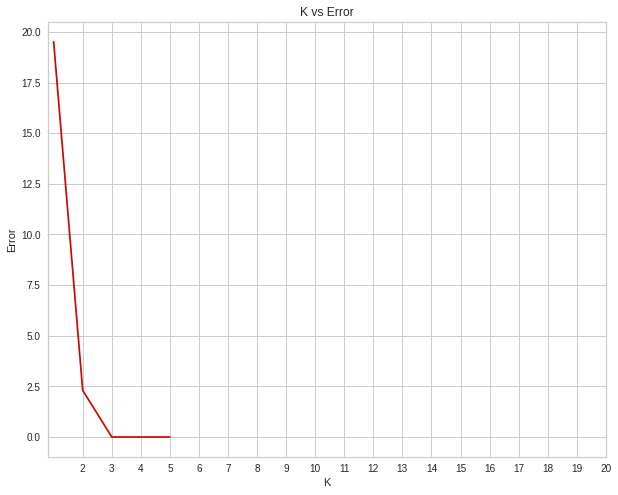

In [49]:
plt.figure(figsize=[10, 8])
sns.lineplot(x=range(1, 6), y=scores, color='r')
plt.title("K vs Error")
plt.xticks(range(2, 21))
plt.xlabel("K")
plt.ylabel("Error")

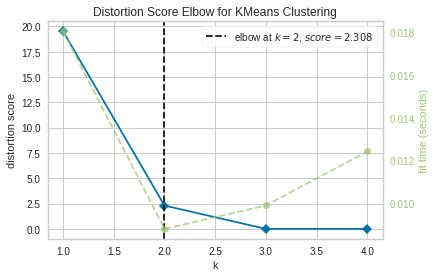

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [64]:
# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,5))

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()   

## We see that the optimum K value is 2 so we will have a resulting of 2 clusters

In [65]:
kclusters = 2

toronto_grouped_clustering = rus.drop('Neighbourhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:3]

array([0, 0, 0], dtype=int32)

In [66]:
# create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.
to_merged = rus.copy()

# add clustering labels
to_merged["Cluster Labels"] = kmeans.labels_
to_merged.head()

,Neighbourhood,Eastern European Restaurant,Cluster Labels
0,"Adelaide,King,Richmond",0.00,0
1,Agincourt,0.00,0
2,"Agincourt North,L'Amoreaux East,Milliken,Steel...",0.00,0
3,"Albion Gardens,Beaumond Heights,Humbergate,Jam...",0.02,1
4,"Alderwood,Long Branch",0.00,0


In [67]:
# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
to_merged = to_merged.join(toronto_venues.set_index("Neighborhood"), on="Neighbourhood")

print(to_merged.shape)
to_merged.head()

(10300, 9)


,Neighbourhood,Eastern European Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Adelaide,King,Richmond",0.0,0,43.650571,-79.384568,Downtown Toronto,43.653232,-79.385296,Neighborhood
0,"Adelaide,King,Richmond",0.0,0,43.650571,-79.384568,Pai,43.647923,-79.388579,Thai Restaurant
0,"Adelaide,King,Richmond",0.0,0,43.650571,-79.384568,Byblos Toronto,43.647615,-79.388381,Mediterranean Restaurant
0,"Adelaide,King,Richmond",0.0,0,43.650571,-79.384568,Nathan Phillips Square,43.652270,-79.383516,Plaza
0,"Adelaide,King,Richmond",0.0,0,43.650571,-79.384568,Delta Hotels by Marriott Toronto,43.642882,-79.383949,Hotel


In [68]:
# sort the results by Cluster Labels
print(to_merged.shape)
to_merged.sort_values(["Cluster Labels"], inplace=True)
to_merged

(10300, 9)


,Neighbourhood,Eastern European Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Adelaide,King,Richmond",0.00,0,43.650571,-79.384568,Downtown Toronto,43.653232,-79.385296,Neighborhood
65,Leaside,0.00,0,43.709060,-79.363452,Te Aro,43.661373,-79.338577,Coffee Shop
65,Leaside,0.00,0,43.709060,-79.363452,Impact Kitchen,43.656369,-79.356980,Restaurant
65,Leaside,0.00,0,43.709060,-79.363452,Auberge du Pommier,43.746962,-79.407879,French Restaurant
65,Leaside,0.00,0,43.709060,-79.363452,Rasa,43.662757,-79.403988,Restaurant
...,...,...,...,...,...,...,...,...,...
90,"The Junction North,Runnymede",0.01,1,43.673185,-79.487262,Humber Bay Park,43.622396,-79.478389,Park
90,"The Junction North,Runnymede",0.01,1,43.673185,-79.487262,Fiesta Farms,43.668471,-79.420485,Grocery Store
90,"The Junction North,Runnymede",0.01,1,43.673185,-79.487262,Christie Pits Park,43.664177,-79.420466,Park
90,"The Junction North,Runnymede",0.01,1,43.673185,-79.487262,Pinky's Ca Phe,43.655530,-79.413879,Asian Restaurant


## Lets check how many Eastern European Restaurant are there

In [69]:
to_merged['Venue Category'].value_counts()['Eastern European Restaurant']
rusrest = to_merged['Venue Category'].value_counts()['Eastern European Restaurant']
print('Eastern European restaurants in area :' ,rusrest)

Eastern European restaurants in area : 24


In [70]:
to_merged['Venue Category'].value_counts()['Restaurant']
restaurants = to_merged['Venue Category'].value_counts()['Restaurant']
print('Total number of restaurants in the area: ',restaurants)

Total number of restaurants in the area:  150


In [71]:
print('Percentage of restaurants in the are are Eastern European :', (rusrest/restaurants)*100 , ' %')
part = rusrest/restaurants
if part < 0.05:
    print('Looks there is not much of competiton!')

Percentage of restaurants in the are are Eastern European : 16.0  %


In [72]:
# create map
map_clusters = folium.Map(location=[lat_toronto, lon_toronto], zoom_start=10)

# set color scheme for the clusters
x = np.arange(kclusters)
ys =[i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)-1))
rainbow = [colors.rgb2hex(i) for i in colors_array]

print(kclusters)
print(x)
print(ys)
print(colors_array)
print(rainbow)

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(to_merged['Neighborhood Latitude'], to_merged['Neighborhood Longitude'], to_merged['Neighbourhood'], to_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' - Cluster ' + str(cluster))
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill_color=rainbow[cluster-1],
        fill_opacity=0.8).add_to(map_clusters)
       
map_clusters

2
[0 1]
[array([0, 1]), array([1, 3])]
[[0.5 0.  1.  1. ]]
['#8000ff']


## How many Neighborhoods per Cluster?

In [73]:
rus["Cluster Labels"] = kmeans.labels_
rus.head()

,Neighbourhood,Eastern European Restaurant,Cluster Labels
0,"Adelaide,King,Richmond",0.00,0
1,Agincourt,0.00,0
2,"Agincourt North,L'Amoreaux East,Milliken,Steel...",0.00,0
3,"Albion Gardens,Beaumond Heights,Humbergate,Jam...",0.02,1
4,"Alderwood,Long Branch",0.00,0


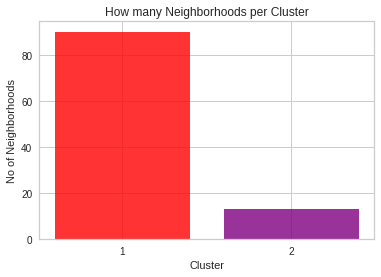

In [89]:
objects = (1,2)
y_pos = np.arange(len(objects))
performance = rus['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance['Cluster Labels'].tolist()
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'darkkhaki'])
plt.xticks(y_pos, objects)
plt.ylabel('No of Neighborhoods')
plt.xlabel('Cluster')
plt.title('How many Neighborhoods per Cluster')

plt.show()

In [75]:
# How many neighborhoods in each cluster
rus['Cluster Labels'].value_counts()

0    90
1    13
Name: Cluster Labels, dtype: int64

## Analysis of each Cluster

### Cluster 1

In [76]:
# This will create a dataframe with borough of each neighborhood which we will merge with each cluster dataframe
df_new = df[['Borough', 'Neighbourhood']]
df_new.head()

,Borough,Neighbourhood
0,Central Toronto,Lawrence Park
1,Central Toronto,Davisville North
2,Central Toronto,North Toronto West
3,Central Toronto,Davisville
4,Central Toronto,"Moore Park,Summerhill East"


In [77]:
# Red 

cluster1 = to_merged.loc[to_merged['Cluster Labels'] == 0]
df_cluster1 = pd.merge(df_new, cluster1, on='Neighbourhood')
df_cluster1

,Borough,Neighbourhood,Eastern European Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Central Toronto,Lawrence Park,0.0,0,43.728020,-79.388790,The Greater Good Bar,43.669409,-79.439267,Bar
1,Central Toronto,Lawrence Park,0.0,0,43.728020,-79.388790,Rendez-Vous Restaurant Bar & Cafe,43.682570,-79.327544,Ethiopian Restaurant
2,Central Toronto,Lawrence Park,0.0,0,43.728020,-79.388790,The Don Valley Brick Works Park,43.685051,-79.367015,Park
3,Central Toronto,Lawrence Park,0.0,0,43.728020,-79.388790,kibo sushi house,43.682727,-79.392270,Sushi Restaurant
4,Central Toronto,Lawrence Park,0.0,0,43.728020,-79.388790,Nordstrom,43.726082,-79.449450,Clothing Store
...,...,...,...,...,...,...,...,...,...,...
8995,York,"Del Ray,Keelesdale,Mount Dennis,Silverthorn",0.0,0,43.691116,-79.476013,Elgin And Winter Garden Theatres,43.653394,-79.378507,Theater
8996,York,"Del Ray,Keelesdale,Mount Dennis,Silverthorn",0.0,0,43.691116,-79.476013,Chorley Park,43.687163,-79.370538,Park
8997,York,"Del Ray,Keelesdale,Mount Dennis,Silverthorn",0.0,0,43.691116,-79.476013,Maple Leaf Gardens,43.661894,-79.379605,Historic Site
8998,York,"Del Ray,Keelesdale,Mount Dennis,Silverthorn",0.0,0,43.691116,-79.476013,Nathan Phillips Square,43.652270,-79.383516,Plaza


In [87]:
df_cluster1.sort_values(["Eastern European Restaurant"], ascending=False)

,Borough,Neighbourhood,Eastern European Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Central Toronto,Lawrence Park,0.0,0,43.728020,-79.388790,The Greater Good Bar,43.669409,-79.439267,Bar
6002,North York,"Lawrence Heights,Lawrence Manor",0.0,0,43.718518,-79.464763,The Abbot,43.703688,-79.413485,Gastropub
5996,North York,"Bedford Park,Lawrence Manor East",0.0,0,43.733283,-79.419750,Godiva Chocolatier,43.725988,-79.454238,Chocolate Shop
5997,North York,"Bedford Park,Lawrence Manor East",0.0,0,43.733283,-79.419750,Grill Gate,43.753123,-79.451690,Mediterranean Restaurant
5998,North York,"Bedford Park,Lawrence Manor East",0.0,0,43.733283,-79.419750,Loblaws,43.707244,-79.394701,Supermarket
...,...,...,...,...,...,...,...,...,...,...
2994,East Toronto,"The Beaches West,India Bazaar",0.0,0,43.668999,-79.315572,Boxcar Social,43.681750,-79.391447,Coffee Shop
2993,East Toronto,"The Beaches West,India Bazaar",0.0,0,43.668999,-79.315572,Queen's Park,43.663946,-79.392180,Park
2992,East Toronto,"The Beaches West,India Bazaar",0.0,0,43.668999,-79.315572,Sunnybrook Park,43.722317,-79.355496,Other Great Outdoors
2991,East Toronto,"The Beaches West,India Bazaar",0.0,0,43.668999,-79.315572,Philosopher's Walk,43.666894,-79.395597,Park


### Cluster 2

In [79]:
# Purple 
cluster2=to_merged.loc[to_merged['Cluster Labels'] == 1]
df_cluster2 = pd.merge(df_new, cluster2, on='Neighbourhood')


In [86]:
df_cluster2.sort_values(["Eastern European Restaurant"], ascending=False)

,Borough,Neighbourhood,Eastern European Restaurant,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
1001,North York,"Emery,Humberlea",0.03,1,43.724766,-79.532242,Starbucks,43.728670,-79.608169,Coffee Shop
1037,North York,"Emery,Humberlea",0.03,1,43.724766,-79.532242,Improve Canada,43.787888,-79.497776,Construction & Landscaping
1026,North York,"Emery,Humberlea",0.03,1,43.724766,-79.532242,TownePlace Suites Mississauga-Airport Corporat...,43.656164,-79.599826,Hotel
1028,North York,"Emery,Humberlea",0.03,1,43.724766,-79.532242,Westwood Arenas,43.740153,-79.608257,Skating Rink
1029,North York,"Emery,Humberlea",0.03,1,43.724766,-79.532242,Crave Grillhouse,43.735189,-79.605331,Steakhouse
...,...,...,...,...,...,...,...,...,...,...
999,North York,"Downsview,North Park,Upwood Park",0.01,1,43.713756,-79.490074,Extended Stay Deluxe,43.772456,-79.538898,Hotel
998,North York,"Downsview,North Park,Upwood Park",0.01,1,43.713756,-79.490074,Dollarama,43.784785,-79.476199,Discount Store
997,North York,"Downsview,North Park,Upwood Park",0.01,1,43.713756,-79.490074,Long & McQuade Musical Instruments,43.781419,-79.490503,Music Store
996,North York,"Downsview,North Park,Upwood Park",0.01,1,43.713756,-79.490074,Offleash Dog Trail - High Park,43.645485,-79.458747,Dog Run


In [130]:
df_cluster2b = df_cluster2
df_cluster2b.groupby('Neighbourhood')
print('There are {} uniques categories.'.format(len(df_cluster2b['Borough'].unique())))
print(df_cluster2b['Borough'].unique())

There are 4 uniques categories.
['Etobicoke' 'Mississauga' 'North York' 'York']


# Conclusion 1

## From data we have from "Demographics of Toronto" section "Ethnic diversity"

### These are the boroughs where Russians and Ukrainians live.
   
   - Russian 	74,465 : 2.8 % of city	: York Centre 	9.5 % of locals
   - Ukrainian 	72,340 : 2.7 % of city	: Etobicoke Centre 	8.1 % of locals

## Let's look at clusters

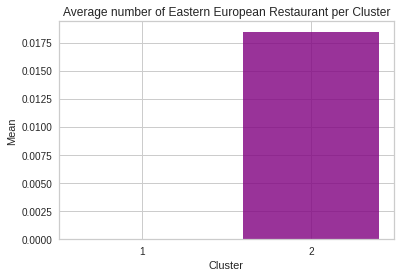

In [81]:
clusters_mean = [df_cluster1['Eastern European Restaurant'].mean(),df_cluster2['Eastern European Restaurant'].mean()] #,df_cluster3['Italian Restaurant'].mean(),
                 #df_cluster4['Italian Restaurant'].mean()]
objects = (1,2)
y_pos = np.arange(len(objects))
perf = clusters_mean
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'darkkhaki'])
plt.xticks(y_pos, objects)
plt.ylabel('Mean')
plt.xlabel('Cluster')
plt.title('Average number of Eastern European Restaurant per Cluster')

plt.show()

## Observations

Most of the Eastern European Restaurant Restaurants are in cluster 2 represented by the purple clusters. As we see there is not much of competition for Eastern European Restaurants other than restaurants in general. Next we have to look at population demographics of Toronto and determine if there is really any requirement for Eastern European or Russian restaurant. As business decision being marginal operator has some benefits than being main stream. 

This analysis shows that when data gets smaller the analytics get more difficult to predict. Rnnins the same analysisn on Italian and Indian restaurants give totally different results. As a recommendation it might be best to locate where most of the peopla are visiting other venues. Also price range of products and services play key role.